In [1]:
import sys
c_path = "/home/fforge/Stage-IA3D/scripts/"
sys.path.append(f"{c_path}/mutations")
sys.path.append(f"{c_path}/orca_predictions")
sys.path.append(f"{c_path}/orcanalyse")

import mutate_module as mm
import process_sequence as ps
import matrices as mat

import pandas as pd
import os

%matplotlib inline

# 

In [2]:
mutationfile = None
bedfile = "./resources/annotations/chr9_300_CTCF_btw_3800000_4300000.bed"
ref_fasta = "./resources/genome/Homo_sapiens.GRCh38.dna.primary_assembly/sequence.fa"
mut_path = "./outputs/genome/mutated_chr9_300_CTCF"
mutationtype = "shuffle"
nb_random = 1

# 

In [3]:
chrom = "chr9"
prediction_prefix = "mut_CTCF_chr9_H_sapiens_first_32Mb"
resol_model = "32Mb"
mpos = 4_000_000
cool_resol = 128_000
strict=False,
padding_chr=None,
use_cuda=False,
use_memmapgenome=False
pred_path = "./outputs/predictions/H_sapiens_chr9_300_CTCF"
builder_path = "./outputs/matrices_builder/start_chr9_H_sapiens_300_CTCF"

# 

In [ ]:
mm.main(mutationfile=None, 
        bed=bedfile, 
        genome=ref_fasta, 
        path=mut_path,
        mutationtype=mutationtype,
        nb_random=nb_random)

Valid mutated chrom chr9
Valid mutated chrom chr9


# 

In [ ]:
data = []
repository = ["Wtd_mut"] + [f"Rdm_mut_{i}" for i in range (nb_random)]

for name in repository:
    ps.main(chrom=chrom,
            output_prefix=f"{prediction_prefix}_{name}",
            mutation=name,
            resol_model=resol_model,
            mpos=mpos,
            fasta=f"{mut_path}/{name}/sequence.fa",
            cool_resol=cool_resol,
            strict=strict,
            padding_chr=padding_chr,
            use_cuda=False,
            use_memmapgenome=use_memmapgenome,
            pred_path=pred_path)
    
    path = f"{pred_path}/{prediction_prefix}_{name}"
    
    l_resol = mat.extract_resol_asc(path)

    data.append([f"orcarun_{name}", 
                 f"{l_resol}", 
                 f"{pred_path}/{prediction_prefix}_{name}", 
                 f"{name}", 
                 f"{mut_path.split('/')[-1]}", 
                 f"MatrixView", 
                 f"{ref_fasta.split('/')[-2]}", 
                 f"OrcaMatrix"])

head = ["name", "list_resol", "path", "gtype", "genome", "obj_type", "refgenome", "mtype"]

if builder_path:
    try:
        builder_path = os.path.abspath(builder_path)
        os.makedirs(builder_path, exist_ok=True)
        print(f"Directory ensured: {builder_path}")
        
        if os.path.exists(builder_path):
            print(f"Directory exists: {builder_path}")
        else:
            print(f"Directory does not exist: {builder_path}")
    except Exception as e:
        print(f"Error creating directory: {e}")
else:
    print("builder_path is not defined or is empty.")

df = pd.DataFrame(data,columns=head)
df.to_csv(f"{builder_path}/orcarun.csv", sep="\t", index=False, header=True)

ps.main(chrom=chrom,
        output_prefix="ref_orcarun",
        mutation="wt",
        resol_model=resol_model,
        mpos=mpos,
        fasta=ref_fasta,
        cool_resol=cool_resol,
        strict=strict,
        padding_chr=padding_chr,
        use_cuda=False,
        use_memmapgenome=use_memmapgenome,
        pred_path=pred_path)

ref_path = f"{pred_path}/ref_orcarun"
l_resol = mat.extract_resol_asc(ref_path)

data_ref = [f"orcarun_ref", 
            f"{l_resol}", 
            f"{pred_path}/ref_orcarun", 
            f"wt", 
            f"{ref_fasta.split('/')[-1]}", 
            f"MatrixView", 
            f"{ref_fasta.split('/')[-2]}", 
            f"OrcaMatrix"]


df_ref = pd.DataFrame([data_ref], columns=head)
df_ref.to_csv(f"{builder_path}/ref_orcarun.csv", sep="\t", index=False, header=True, mode='w')


2025-04-28 17:09:13,649 - INFO - Time taken to load genome: 0.00 seconds
2025-04-28 17:09:17,546 - INFO - Time taken to get encoded sequence: 3.16 seconds
/home/fforge/miniforge3/envs/orca_env/lib/python3.9/site-packages/torch/cuda/__init__.py:129: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11040). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at /pytorch/c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0
2025-04-28 17:09:22,244 - INFO - Time taken to load the ressources: 4.70 seconds
/home/fforge/miniforge3/envs/orca_env/lib/python3.9/site-packages/torch/_dynamo/eval_frame.py:745: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In

Directory ensured: /home/fforge/Stage-IA3D/notebooks/outputs/matrices_builder/start_chr9_H_sapiens_300_CTCF
Directory exists: /home/fforge/Stage-IA3D/notebooks/outputs/matrices_builder/start_chr9_H_sapiens_300_CTCF


2025-04-28 17:18:08,099 - INFO - Time taken to get encoded sequence: 3.13 seconds
2025-04-28 17:18:12,503 - INFO - Time taken to load the ressources: 4.40 seconds
/home/fforge/miniforge3/envs/orca_env/lib/python3.9/site-packages/torch/_dynamo/eval_frame.py:745: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
2025-04-28 17:22:25,411 - INFO - Time taken for predictions: 252.91 seconds
2025-04-28 17:22:25,971 - INFO - Total time taken by main: 261.00 seconds


# 

In [ ]:
mat_comparisons = mat.build_CompareMatrices(filepathref=f"{builder_path}/ref_orcarun.csv", filepathcomp=f"{builder_path}/orcarun.csv")

# 

In [ ]:
mat_comparisons.heatmaps()

# 

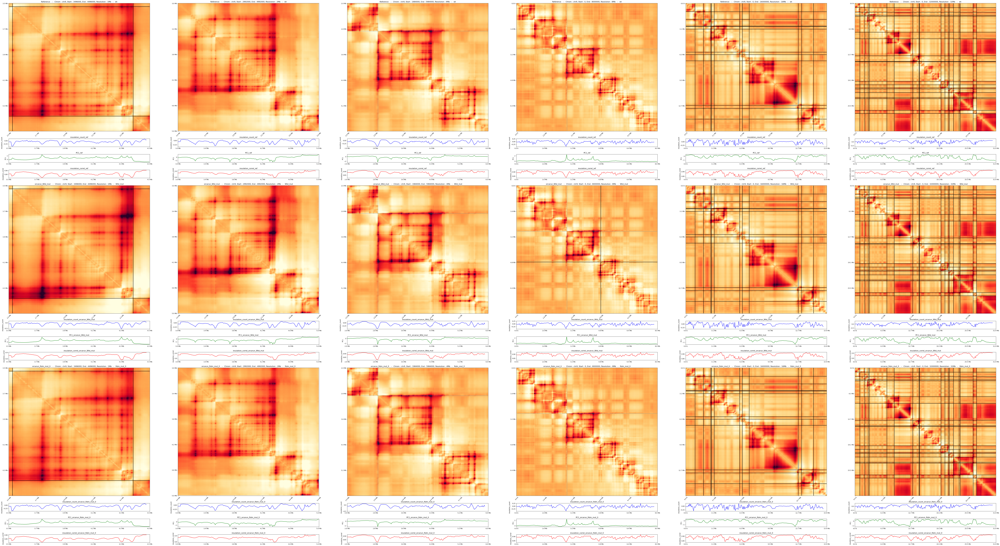

In [ ]:
mat_comparisons.all_graphs()

# 

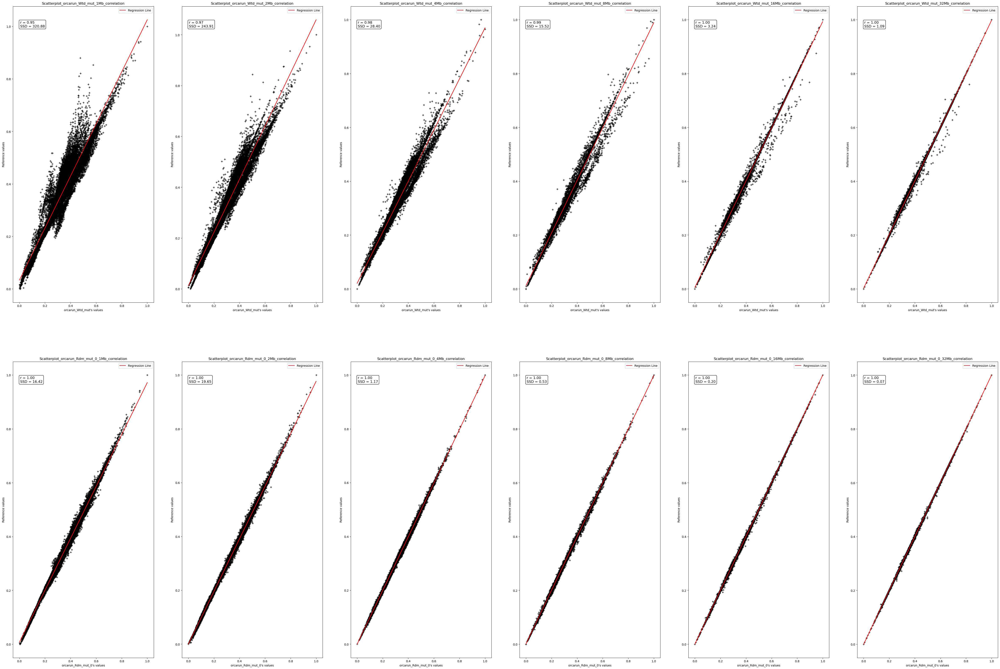

In [5]:
mat_comparisons.correl_mat()

# 

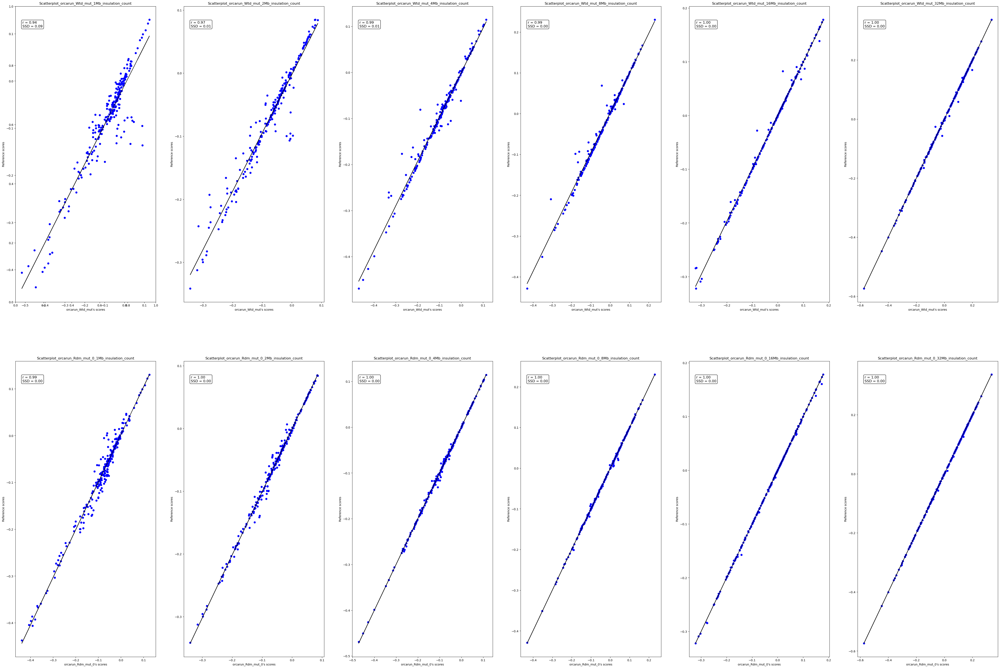

In [ ]:
mat_comparisons.scores_regression()

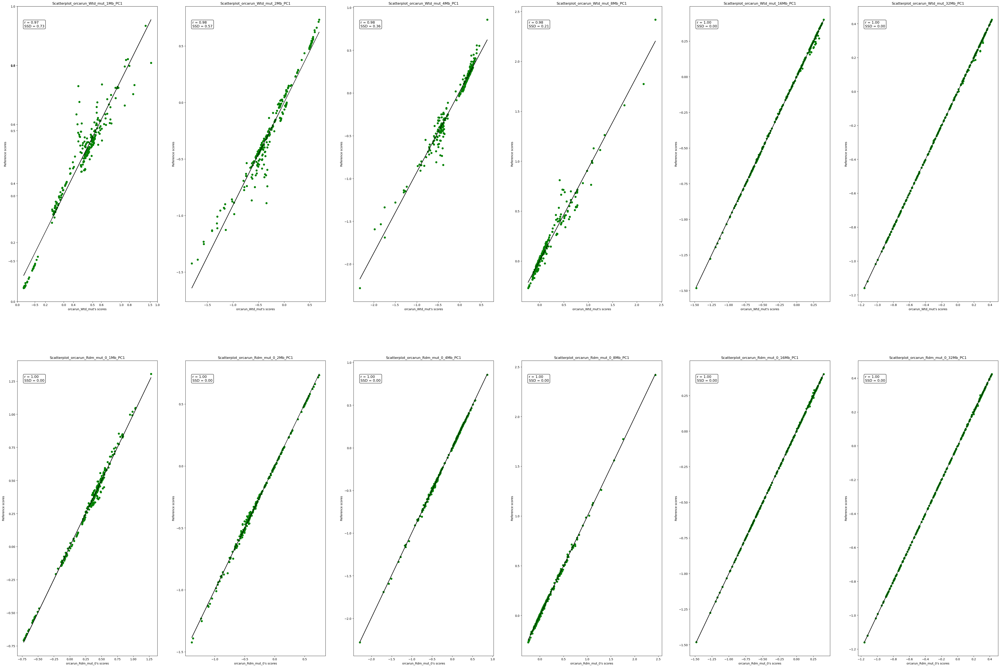

In [ ]:
mat_comparisons.scores_regression(score_type="PC1")

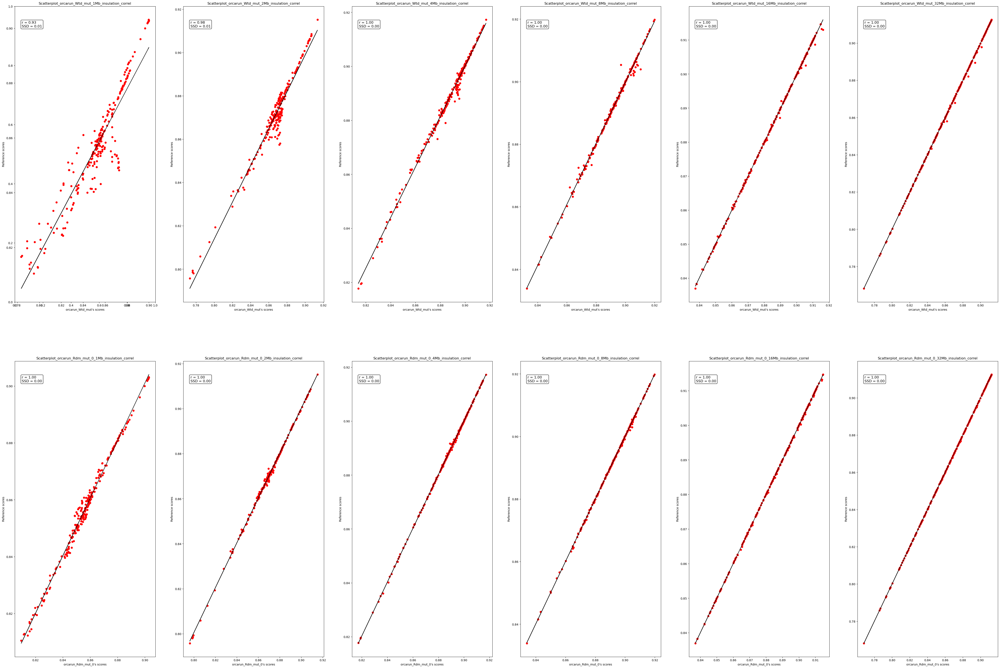

In [ ]:
mat_comparisons.scores_regression(score_type="insulation_correl")

# 

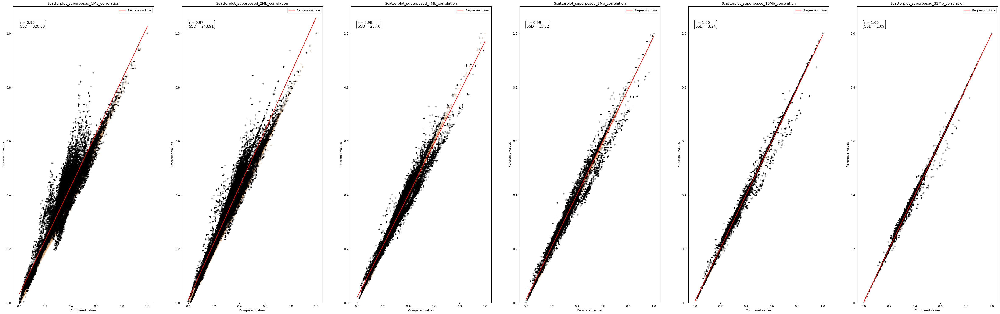

In [4]:
mat_comparisons = mat.build_CompareMatrices(filepathref=f"{builder_path}/ref_orcarun.csv", filepathcomp=f"{builder_path}/orcarun.csv")
mat_comparisons.superposed_scatter(ftype=mat_comparisons.correl_mat)

# 

dict_keys(['1Mb', '2Mb', '4Mb', '8Mb', '16Mb', '32Mb'])


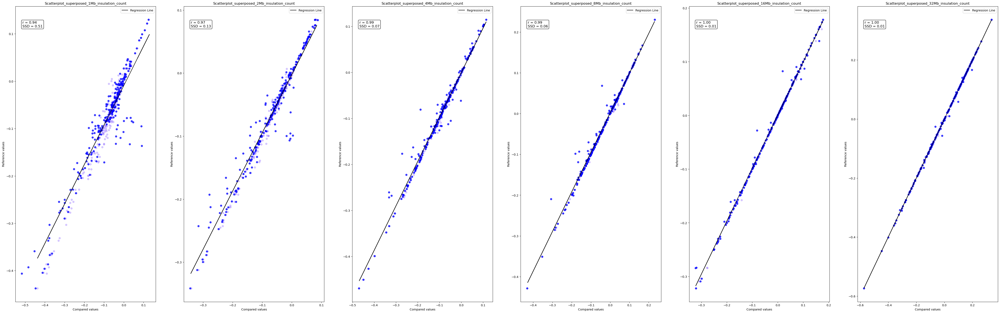

In [5]:
mat_comparisons.superposed_scatter(ftype=mat_comparisons.scores_regression)

dict_keys(['1Mb', '2Mb', '4Mb', '8Mb', '16Mb', '32Mb'])


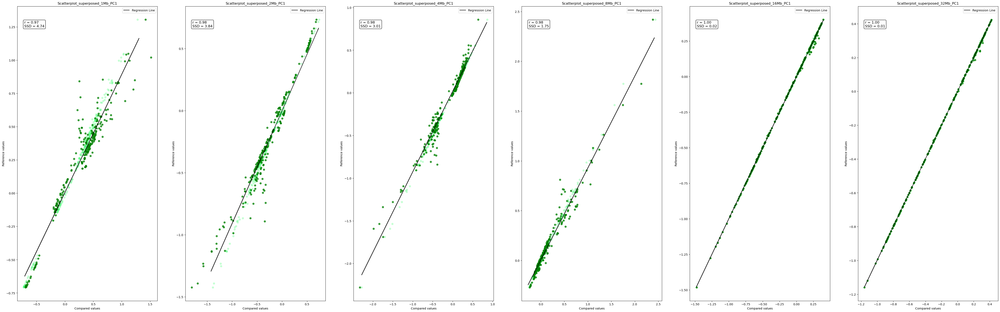

In [6]:
mat_comparisons.superposed_scatter(ftype=mat_comparisons.scores_regression, score_type="PC1")

dict_keys(['1Mb', '2Mb', '4Mb', '8Mb', '16Mb', '32Mb'])


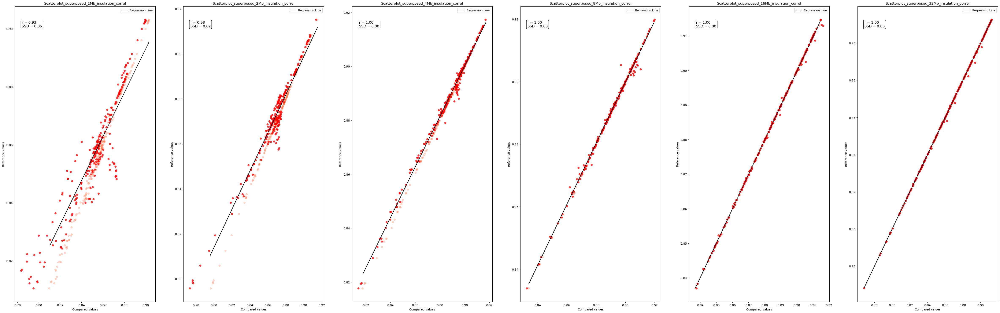

In [7]:
mat_comparisons.superposed_scatter(ftype=mat_comparisons.scores_regression, score_type="insulation_correl")